# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

**Footnote:**
1. remember not to use `batch_normalization` in the first and output layer for both **generator** and **discriminator**. When we use batch normalization in the first layer, sometimes the model comes up with weird results. 
2. Use Leaky ReLu for it will convert the negative values into small negative value (unlike Relu, which will come out 0). This way the neural network node won't die out so easily.
3. No max pooling layer is needed in this model.
4. When we observe the loss value of discriminator and generator, if the loss for discriminator is around 0.3 (implying that the discriminator predicts the images correctly 50% of the time and incorrectly 50% of the time.). And the loss of generator is around 2 or 3, that is a good sign showing the model works well.
5. Hopefully we get the loss of generator close to 0 or smaller than the loss of discriminator at the beginning.
6. For hyperparameter setting, we can take reference from [this paper](https://arxiv.org/pdf/1511.06434.pdf).

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [5]:
print(trainset['X'].shape)

(32, 32, 3, 73257)


Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

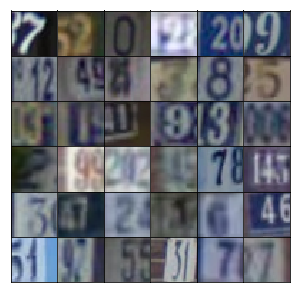

In [6]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [10]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        z1 = tf.layers.dense(z, 4*4*512, activation=None)
        z1 = tf.reshape(z1, shape=[-1, 4, 4, 512])
        z1 = tf.layers.batch_normalization(z1, training=training)
        z1 = tf.maximum(z1*alpha, z1) # Leaky Relu activation
 
        z2 = tf.layers.conv2d_transpose(inputs=z1,filters=256,kernel_size=5,strides=2,padding='same',use_bias=False)
        z2 = tf.layers.batch_normalization(z2, training=training)
        z2 = tf.maximum(z2*alpha, z2)
        # Output layer, 8x8x256
        
        z3 = tf.layers.conv2d_transpose(inputs=z2,filters=128,kernel_size=5,strides=2,padding='same',use_bias=False)
        z3 = tf.layers.batch_normalization(z3, training=training)
        z3 = tf.maximum(z3*alpha, z3)
        # Output layer, 16x16x128
        

        logits = tf.layers.conv2d_transpose(inputs=z3,filters=output_dim,\
                                            kernel_size=5,strides=2,padding='same',use_bias=True)
        # Output layer, 32x32x3
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer **except the first convolutional and output layers**. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [11]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        
        x1 = tf.layers.conv2d(x,filters=32,kernel_size=5,strides=2,padding='same',activation=None,use_bias=True)
        x1 = tf.maximum(x1*alpha, x1) # No batch normalization implemented in first layer
        # Output layer is 16x16x32
        
        x2 = tf.layers.conv2d(x1,filters=64,kernel_size=5,strides=2,padding='same',activation=None,use_bias=False)
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(x2*alpha, x2)
        # Output layer is 8x8x64
        
        x3 = tf.layers.conv2d(x2,filters=128,kernel_size=5,strides=2,padding='same',activation=None,use_bias=False)
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(x3*alpha, x3)
        # Output layer is 4x4x128
        
        # feed into fully connected layer
        x3 = tf.reshape(x3, [-1, 4*4*128])
        logits = tf.layers.dense(x3, 1, activation=None, use_bias=True)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [12]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [13]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [14]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [15]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8) # reverse back to original scale
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [16]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, **you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time**.

In [17]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 10
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 5.2519... Generator Loss: 0.0127
Epoch 1/10... Discriminator Loss: 4.2681... Generator Loss: 0.0409
Epoch 1/10... Discriminator Loss: 2.7343... Generator Loss: 0.1737
Epoch 1/10... Discriminator Loss: 1.4909... Generator Loss: 0.7216
Epoch 1/10... Discriminator Loss: 1.1530... Generator Loss: 0.9843
Epoch 1/10... Discriminator Loss: 0.8428... Generator Loss: 1.0185
Epoch 1/10... Discriminator Loss: 0.9876... Generator Loss: 0.7559
Epoch 1/10... Discriminator Loss: 0.9265... Generator Loss: 1.3093
Epoch 1/10... Discriminator Loss: 0.6931... Generator Loss: 1.3842
Epoch 1/10... Discriminator Loss: 0.6889... Generator Loss: 1.4933


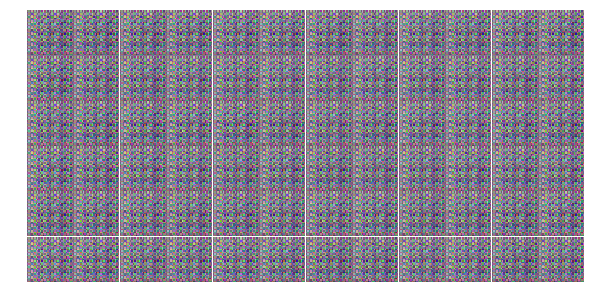

Epoch 1/10... Discriminator Loss: 0.9337... Generator Loss: 0.7998
Epoch 1/10... Discriminator Loss: 0.5421... Generator Loss: 1.6247
Epoch 1/10... Discriminator Loss: 0.4267... Generator Loss: 1.6187
Epoch 1/10... Discriminator Loss: 0.7193... Generator Loss: 1.6279
Epoch 1/10... Discriminator Loss: 0.5344... Generator Loss: 1.8964
Epoch 1/10... Discriminator Loss: 0.4011... Generator Loss: 1.7547
Epoch 1/10... Discriminator Loss: 0.4638... Generator Loss: 1.5928
Epoch 1/10... Discriminator Loss: 0.6059... Generator Loss: 1.4243
Epoch 1/10... Discriminator Loss: 0.4630... Generator Loss: 1.8720
Epoch 1/10... Discriminator Loss: 0.2264... Generator Loss: 2.3573


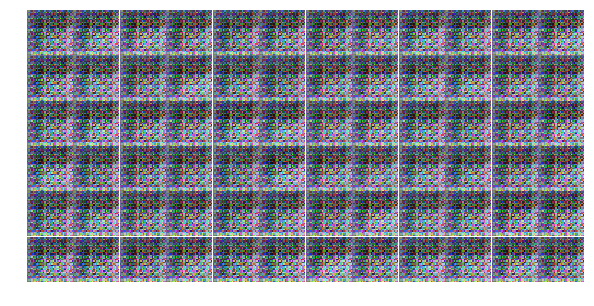

Epoch 1/10... Discriminator Loss: 0.3657... Generator Loss: 1.7620
Epoch 1/10... Discriminator Loss: 0.9331... Generator Loss: 0.9598
Epoch 1/10... Discriminator Loss: 1.6218... Generator Loss: 0.6222
Epoch 1/10... Discriminator Loss: 1.2431... Generator Loss: 0.8461
Epoch 1/10... Discriminator Loss: 1.3841... Generator Loss: 0.8151
Epoch 1/10... Discriminator Loss: 1.5940... Generator Loss: 0.5918
Epoch 1/10... Discriminator Loss: 1.1015... Generator Loss: 0.9102
Epoch 1/10... Discriminator Loss: 1.3617... Generator Loss: 0.7667
Epoch 1/10... Discriminator Loss: 1.2826... Generator Loss: 0.7960
Epoch 1/10... Discriminator Loss: 1.2674... Generator Loss: 0.7515


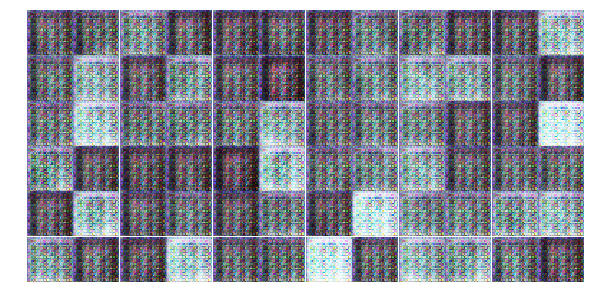

Epoch 1/10... Discriminator Loss: 1.3445... Generator Loss: 0.7859
Epoch 1/10... Discriminator Loss: 1.3568... Generator Loss: 0.7878
Epoch 1/10... Discriminator Loss: 1.2419... Generator Loss: 0.8633
Epoch 1/10... Discriminator Loss: 1.1833... Generator Loss: 0.7879
Epoch 1/10... Discriminator Loss: 1.3097... Generator Loss: 0.7987
Epoch 1/10... Discriminator Loss: 1.1614... Generator Loss: 0.8950
Epoch 1/10... Discriminator Loss: 1.3640... Generator Loss: 0.7727
Epoch 1/10... Discriminator Loss: 1.2871... Generator Loss: 0.7612
Epoch 1/10... Discriminator Loss: 1.1184... Generator Loss: 0.8885
Epoch 1/10... Discriminator Loss: 1.1732... Generator Loss: 0.9565


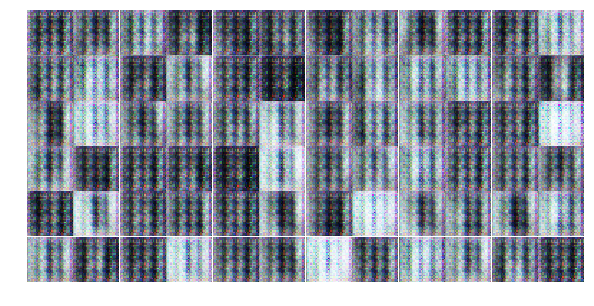

Epoch 1/10... Discriminator Loss: 1.0798... Generator Loss: 0.8603
Epoch 1/10... Discriminator Loss: 0.9231... Generator Loss: 1.1406
Epoch 1/10... Discriminator Loss: 1.0772... Generator Loss: 0.9501
Epoch 1/10... Discriminator Loss: 0.8212... Generator Loss: 1.2883
Epoch 1/10... Discriminator Loss: 1.0180... Generator Loss: 0.9157
Epoch 1/10... Discriminator Loss: 0.9383... Generator Loss: 1.1220
Epoch 1/10... Discriminator Loss: 0.8706... Generator Loss: 1.4191
Epoch 1/10... Discriminator Loss: 1.0570... Generator Loss: 1.0773
Epoch 1/10... Discriminator Loss: 1.0628... Generator Loss: 0.9816
Epoch 1/10... Discriminator Loss: 1.1658... Generator Loss: 0.9125


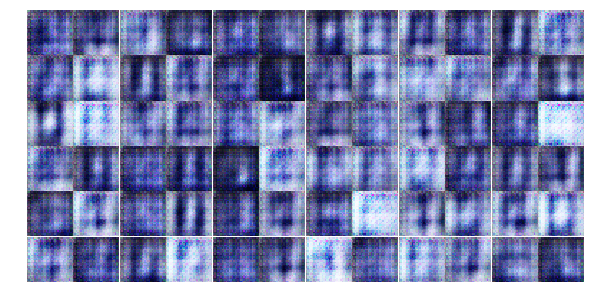

Epoch 1/10... Discriminator Loss: 1.0869... Generator Loss: 0.9789
Epoch 1/10... Discriminator Loss: 0.8673... Generator Loss: 1.2291
Epoch 1/10... Discriminator Loss: 0.6197... Generator Loss: 1.4238
Epoch 1/10... Discriminator Loss: 1.2971... Generator Loss: 0.4535
Epoch 1/10... Discriminator Loss: 0.5240... Generator Loss: 1.7908
Epoch 1/10... Discriminator Loss: 0.9657... Generator Loss: 1.0800
Epoch 1/10... Discriminator Loss: 1.3141... Generator Loss: 0.8623
Epoch 2/10... Discriminator Loss: 0.4242... Generator Loss: 2.8755
Epoch 2/10... Discriminator Loss: 0.8176... Generator Loss: 0.9331
Epoch 2/10... Discriminator Loss: 0.6576... Generator Loss: 1.2101


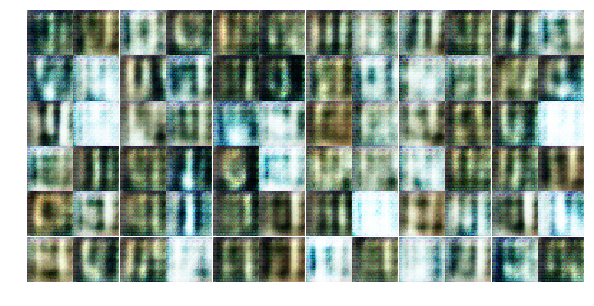

Epoch 2/10... Discriminator Loss: 1.2044... Generator Loss: 0.6396
Epoch 2/10... Discriminator Loss: 1.3956... Generator Loss: 0.5991
Epoch 2/10... Discriminator Loss: 1.2831... Generator Loss: 1.4246
Epoch 2/10... Discriminator Loss: 1.1664... Generator Loss: 1.0890
Epoch 2/10... Discriminator Loss: 0.8283... Generator Loss: 1.1299
Epoch 2/10... Discriminator Loss: 1.0733... Generator Loss: 0.9268
Epoch 2/10... Discriminator Loss: 1.0163... Generator Loss: 1.1205
Epoch 2/10... Discriminator Loss: 1.2283... Generator Loss: 0.9357
Epoch 2/10... Discriminator Loss: 1.2941... Generator Loss: 0.7465
Epoch 2/10... Discriminator Loss: 1.0740... Generator Loss: 1.1110


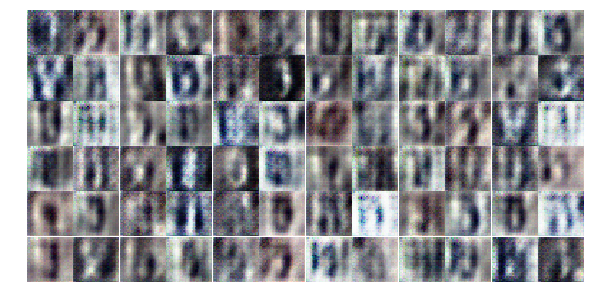

Epoch 2/10... Discriminator Loss: 1.4461... Generator Loss: 0.6399
Epoch 2/10... Discriminator Loss: 1.2777... Generator Loss: 0.7836
Epoch 2/10... Discriminator Loss: 1.0191... Generator Loss: 1.0192
Epoch 2/10... Discriminator Loss: 1.0114... Generator Loss: 1.0200
Epoch 2/10... Discriminator Loss: 1.1203... Generator Loss: 1.0762
Epoch 2/10... Discriminator Loss: 1.2373... Generator Loss: 0.8760
Epoch 2/10... Discriminator Loss: 1.1882... Generator Loss: 0.5768
Epoch 2/10... Discriminator Loss: 1.4244... Generator Loss: 0.5449
Epoch 2/10... Discriminator Loss: 1.2017... Generator Loss: 0.6559
Epoch 2/10... Discriminator Loss: 0.7201... Generator Loss: 1.2388


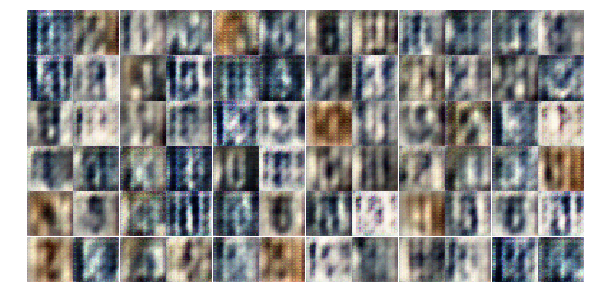

Epoch 2/10... Discriminator Loss: 1.2612... Generator Loss: 0.8893
Epoch 2/10... Discriminator Loss: 0.5627... Generator Loss: 1.4172
Epoch 2/10... Discriminator Loss: 0.9184... Generator Loss: 2.4987
Epoch 2/10... Discriminator Loss: 1.0813... Generator Loss: 1.1002
Epoch 2/10... Discriminator Loss: 1.0863... Generator Loss: 1.0055
Epoch 2/10... Discriminator Loss: 1.1325... Generator Loss: 0.7040
Epoch 2/10... Discriminator Loss: 1.1221... Generator Loss: 0.8199
Epoch 2/10... Discriminator Loss: 1.6933... Generator Loss: 0.3943
Epoch 2/10... Discriminator Loss: 1.1578... Generator Loss: 0.9102
Epoch 2/10... Discriminator Loss: 1.0063... Generator Loss: 0.8791


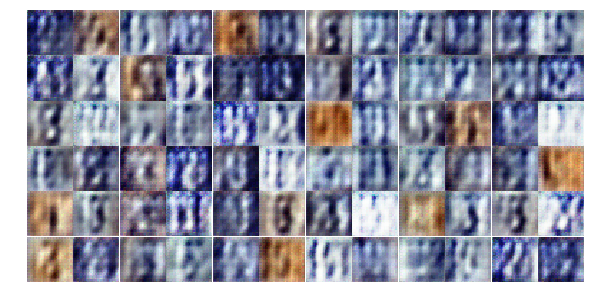

Epoch 2/10... Discriminator Loss: 1.3589... Generator Loss: 0.7414
Epoch 2/10... Discriminator Loss: 1.5582... Generator Loss: 0.6010
Epoch 2/10... Discriminator Loss: 1.0442... Generator Loss: 1.0359
Epoch 2/10... Discriminator Loss: 1.4707... Generator Loss: 0.7428
Epoch 2/10... Discriminator Loss: 1.1850... Generator Loss: 0.8810
Epoch 2/10... Discriminator Loss: 1.0944... Generator Loss: 1.0170
Epoch 2/10... Discriminator Loss: 0.9425... Generator Loss: 1.0999
Epoch 2/10... Discriminator Loss: 1.5377... Generator Loss: 0.7507
Epoch 2/10... Discriminator Loss: 1.1398... Generator Loss: 0.8280
Epoch 2/10... Discriminator Loss: 1.1479... Generator Loss: 1.2622


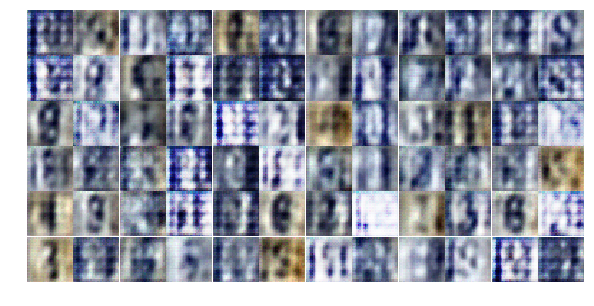

Epoch 2/10... Discriminator Loss: 0.9579... Generator Loss: 1.0949
Epoch 2/10... Discriminator Loss: 1.1182... Generator Loss: 1.0319
Epoch 2/10... Discriminator Loss: 0.9706... Generator Loss: 0.9779
Epoch 2/10... Discriminator Loss: 1.0009... Generator Loss: 1.0221
Epoch 2/10... Discriminator Loss: 1.3410... Generator Loss: 0.9243
Epoch 2/10... Discriminator Loss: 1.1474... Generator Loss: 0.8036
Epoch 2/10... Discriminator Loss: 0.8954... Generator Loss: 1.2802
Epoch 2/10... Discriminator Loss: 1.4108... Generator Loss: 0.6660
Epoch 2/10... Discriminator Loss: 1.3172... Generator Loss: 0.6635
Epoch 2/10... Discriminator Loss: 1.2214... Generator Loss: 0.9699


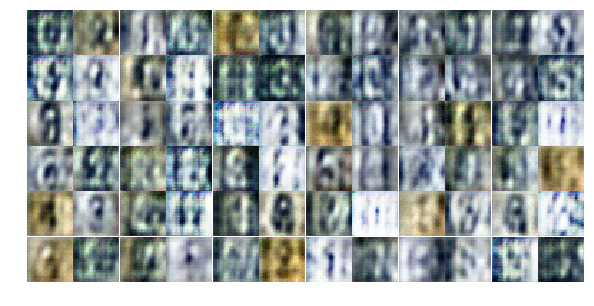

Epoch 2/10... Discriminator Loss: 1.5061... Generator Loss: 0.7648
Epoch 2/10... Discriminator Loss: 1.2723... Generator Loss: 0.9657
Epoch 2/10... Discriminator Loss: 1.2524... Generator Loss: 0.8405
Epoch 2/10... Discriminator Loss: 1.3751... Generator Loss: 0.6961
Epoch 3/10... Discriminator Loss: 1.0457... Generator Loss: 0.9101
Epoch 3/10... Discriminator Loss: 1.4405... Generator Loss: 0.6878
Epoch 3/10... Discriminator Loss: 1.0925... Generator Loss: 1.0750
Epoch 3/10... Discriminator Loss: 1.1937... Generator Loss: 0.8985
Epoch 3/10... Discriminator Loss: 1.3126... Generator Loss: 0.6779
Epoch 3/10... Discriminator Loss: 1.3493... Generator Loss: 0.7666


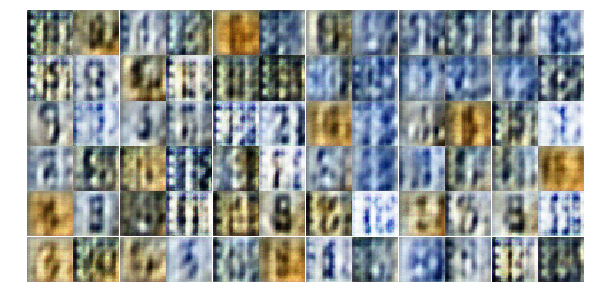

Epoch 3/10... Discriminator Loss: 0.9226... Generator Loss: 1.1651
Epoch 3/10... Discriminator Loss: 1.1750... Generator Loss: 0.9187
Epoch 3/10... Discriminator Loss: 1.0065... Generator Loss: 1.1751
Epoch 3/10... Discriminator Loss: 1.2998... Generator Loss: 0.8296
Epoch 3/10... Discriminator Loss: 1.5102... Generator Loss: 0.6918
Epoch 3/10... Discriminator Loss: 1.3457... Generator Loss: 0.7883
Epoch 3/10... Discriminator Loss: 1.5105... Generator Loss: 0.6385
Epoch 3/10... Discriminator Loss: 1.4105... Generator Loss: 0.7382
Epoch 3/10... Discriminator Loss: 1.4043... Generator Loss: 0.6253
Epoch 3/10... Discriminator Loss: 1.2526... Generator Loss: 0.9214


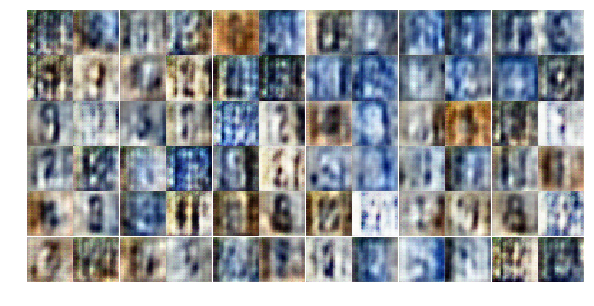

Epoch 3/10... Discriminator Loss: 1.3645... Generator Loss: 0.7303
Epoch 3/10... Discriminator Loss: 1.2472... Generator Loss: 0.8762
Epoch 3/10... Discriminator Loss: 1.2680... Generator Loss: 0.7386
Epoch 3/10... Discriminator Loss: 1.2690... Generator Loss: 0.7973
Epoch 3/10... Discriminator Loss: 1.4111... Generator Loss: 0.7453
Epoch 3/10... Discriminator Loss: 1.1279... Generator Loss: 1.0067
Epoch 3/10... Discriminator Loss: 1.7423... Generator Loss: 0.4628
Epoch 3/10... Discriminator Loss: 1.2706... Generator Loss: 0.7067
Epoch 3/10... Discriminator Loss: 1.2907... Generator Loss: 0.7582
Epoch 3/10... Discriminator Loss: 1.5067... Generator Loss: 0.8017


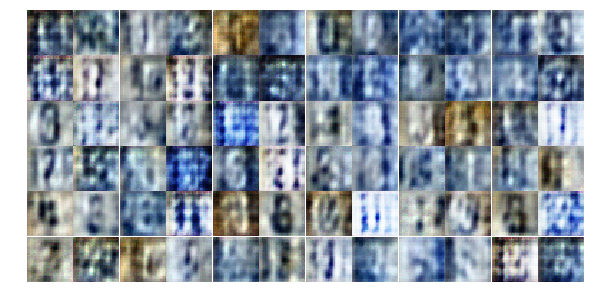

Epoch 3/10... Discriminator Loss: 1.4663... Generator Loss: 0.7640
Epoch 3/10... Discriminator Loss: 1.2762... Generator Loss: 0.7852
Epoch 3/10... Discriminator Loss: 1.4733... Generator Loss: 0.6139
Epoch 3/10... Discriminator Loss: 1.3191... Generator Loss: 0.6686
Epoch 3/10... Discriminator Loss: 1.4593... Generator Loss: 0.6483
Epoch 3/10... Discriminator Loss: 1.3409... Generator Loss: 0.8752
Epoch 3/10... Discriminator Loss: 1.2583... Generator Loss: 0.7735
Epoch 3/10... Discriminator Loss: 1.5411... Generator Loss: 0.6261
Epoch 3/10... Discriminator Loss: 1.4577... Generator Loss: 0.8208
Epoch 3/10... Discriminator Loss: 1.5200... Generator Loss: 0.6577


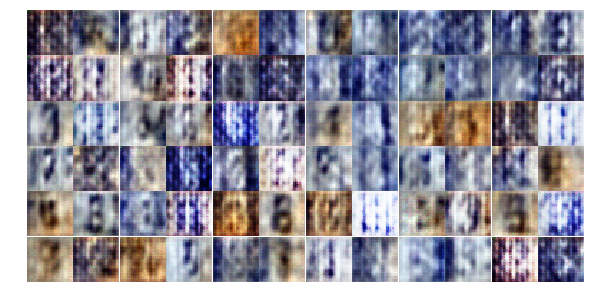

Epoch 3/10... Discriminator Loss: 1.4411... Generator Loss: 0.7263
Epoch 3/10... Discriminator Loss: 1.1740... Generator Loss: 0.8000
Epoch 3/10... Discriminator Loss: 1.3426... Generator Loss: 0.7988
Epoch 3/10... Discriminator Loss: 1.8086... Generator Loss: 0.5636
Epoch 3/10... Discriminator Loss: 1.2945... Generator Loss: 0.7259
Epoch 3/10... Discriminator Loss: 1.4398... Generator Loss: 0.6848
Epoch 3/10... Discriminator Loss: 1.3673... Generator Loss: 0.7954
Epoch 3/10... Discriminator Loss: 1.4611... Generator Loss: 0.6466
Epoch 3/10... Discriminator Loss: 1.1948... Generator Loss: 0.7441
Epoch 3/10... Discriminator Loss: 1.3460... Generator Loss: 0.7514


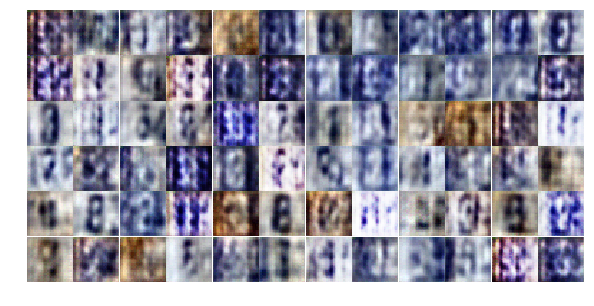

Epoch 3/10... Discriminator Loss: 1.4206... Generator Loss: 0.7426
Epoch 3/10... Discriminator Loss: 1.5097... Generator Loss: 0.6330
Epoch 3/10... Discriminator Loss: 1.4316... Generator Loss: 0.6746
Epoch 3/10... Discriminator Loss: 1.3243... Generator Loss: 0.7438
Epoch 3/10... Discriminator Loss: 1.3735... Generator Loss: 0.7295
Epoch 3/10... Discriminator Loss: 1.2325... Generator Loss: 0.8207
Epoch 3/10... Discriminator Loss: 1.4064... Generator Loss: 0.7224
Epoch 3/10... Discriminator Loss: 1.2329... Generator Loss: 0.7523
Epoch 3/10... Discriminator Loss: 1.2753... Generator Loss: 0.8213
Epoch 3/10... Discriminator Loss: 1.3882... Generator Loss: 0.7223


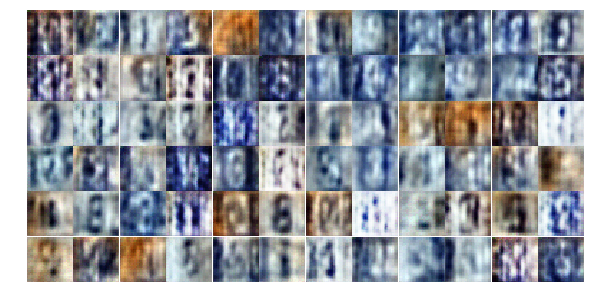

Epoch 3/10... Discriminator Loss: 1.3886... Generator Loss: 0.7515
Epoch 4/10... Discriminator Loss: 1.2893... Generator Loss: 0.8224
Epoch 4/10... Discriminator Loss: 1.3680... Generator Loss: 0.7574
Epoch 4/10... Discriminator Loss: 1.1788... Generator Loss: 0.8314
Epoch 4/10... Discriminator Loss: 1.3097... Generator Loss: 0.7206
Epoch 4/10... Discriminator Loss: 1.4573... Generator Loss: 0.6558
Epoch 4/10... Discriminator Loss: 1.3079... Generator Loss: 0.7972
Epoch 4/10... Discriminator Loss: 1.5344... Generator Loss: 0.6347
Epoch 4/10... Discriminator Loss: 1.3280... Generator Loss: 0.6660
Epoch 4/10... Discriminator Loss: 1.3456... Generator Loss: 0.8305


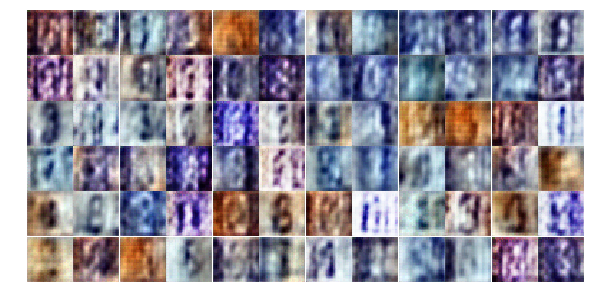

Epoch 4/10... Discriminator Loss: 1.4326... Generator Loss: 0.6646
Epoch 4/10... Discriminator Loss: 1.3173... Generator Loss: 0.7879
Epoch 4/10... Discriminator Loss: 1.3412... Generator Loss: 0.7562
Epoch 4/10... Discriminator Loss: 1.4784... Generator Loss: 0.6839
Epoch 4/10... Discriminator Loss: 1.2077... Generator Loss: 0.7704
Epoch 4/10... Discriminator Loss: 1.3996... Generator Loss: 0.7379
Epoch 4/10... Discriminator Loss: 1.4446... Generator Loss: 0.6857
Epoch 4/10... Discriminator Loss: 1.2566... Generator Loss: 0.8306
Epoch 4/10... Discriminator Loss: 1.3901... Generator Loss: 0.6529
Epoch 4/10... Discriminator Loss: 1.2077... Generator Loss: 0.7339


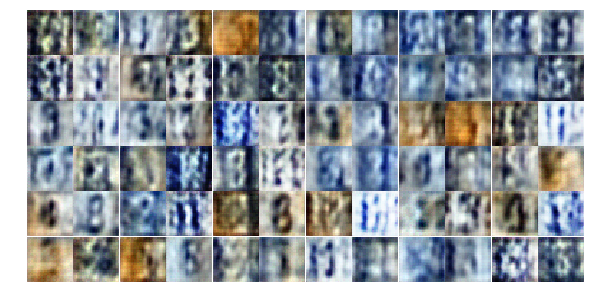

Epoch 4/10... Discriminator Loss: 1.3061... Generator Loss: 0.7666
Epoch 4/10... Discriminator Loss: 1.3871... Generator Loss: 0.7422
Epoch 4/10... Discriminator Loss: 1.3472... Generator Loss: 0.7219
Epoch 4/10... Discriminator Loss: 1.4188... Generator Loss: 0.7150
Epoch 4/10... Discriminator Loss: 1.1440... Generator Loss: 0.8551
Epoch 4/10... Discriminator Loss: 1.2803... Generator Loss: 0.7596
Epoch 4/10... Discriminator Loss: 1.3525... Generator Loss: 0.7439
Epoch 4/10... Discriminator Loss: 1.2462... Generator Loss: 0.7815
Epoch 4/10... Discriminator Loss: 1.2636... Generator Loss: 0.7582
Epoch 4/10... Discriminator Loss: 1.2678... Generator Loss: 0.7845


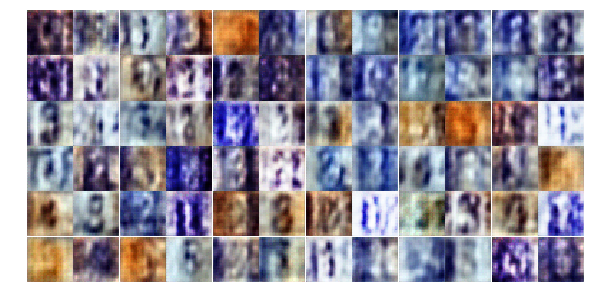

Epoch 4/10... Discriminator Loss: 1.2476... Generator Loss: 0.7840
Epoch 4/10... Discriminator Loss: 1.3427... Generator Loss: 0.7405
Epoch 4/10... Discriminator Loss: 1.3309... Generator Loss: 0.7303
Epoch 4/10... Discriminator Loss: 1.2371... Generator Loss: 0.8523
Epoch 4/10... Discriminator Loss: 1.2753... Generator Loss: 0.7529
Epoch 4/10... Discriminator Loss: 1.4241... Generator Loss: 0.7170
Epoch 4/10... Discriminator Loss: 1.4769... Generator Loss: 0.6229
Epoch 4/10... Discriminator Loss: 1.2404... Generator Loss: 0.7190
Epoch 4/10... Discriminator Loss: 1.4207... Generator Loss: 0.6779
Epoch 4/10... Discriminator Loss: 1.3391... Generator Loss: 0.6701


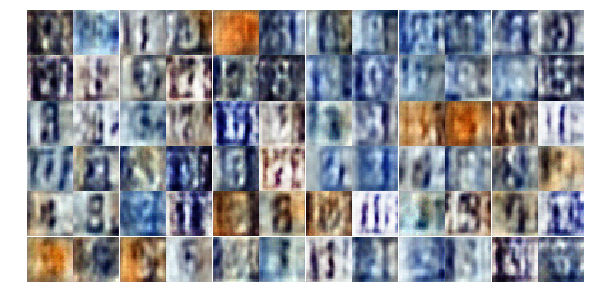

Epoch 4/10... Discriminator Loss: 1.3571... Generator Loss: 0.7978
Epoch 4/10... Discriminator Loss: 1.2874... Generator Loss: 0.8634
Epoch 4/10... Discriminator Loss: 1.4744... Generator Loss: 0.6716
Epoch 4/10... Discriminator Loss: 1.2456... Generator Loss: 0.8446
Epoch 4/10... Discriminator Loss: 1.3402... Generator Loss: 0.8512
Epoch 4/10... Discriminator Loss: 1.1441... Generator Loss: 0.8886
Epoch 4/10... Discriminator Loss: 1.1918... Generator Loss: 0.8471
Epoch 4/10... Discriminator Loss: 1.2841... Generator Loss: 0.7103
Epoch 4/10... Discriminator Loss: 1.0417... Generator Loss: 0.9132
Epoch 4/10... Discriminator Loss: 1.2471... Generator Loss: 0.8457


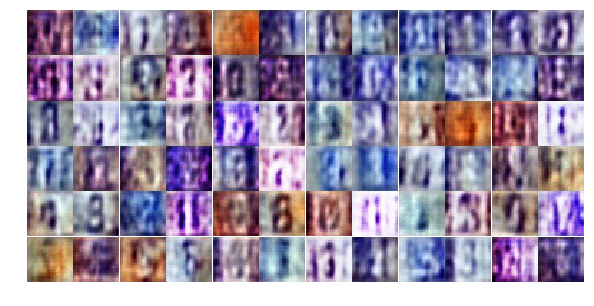

Epoch 4/10... Discriminator Loss: 1.1090... Generator Loss: 0.9129
Epoch 4/10... Discriminator Loss: 1.1237... Generator Loss: 1.0198
Epoch 4/10... Discriminator Loss: 1.0428... Generator Loss: 0.9149
Epoch 4/10... Discriminator Loss: 1.2579... Generator Loss: 0.7536
Epoch 4/10... Discriminator Loss: 1.5690... Generator Loss: 0.6131
Epoch 4/10... Discriminator Loss: 1.1606... Generator Loss: 0.8302
Epoch 4/10... Discriminator Loss: 1.1822... Generator Loss: 0.5739
Epoch 4/10... Discriminator Loss: 1.2673... Generator Loss: 0.6845
Epoch 4/10... Discriminator Loss: 1.3576... Generator Loss: 0.7040
Epoch 5/10... Discriminator Loss: 0.9027... Generator Loss: 1.0658


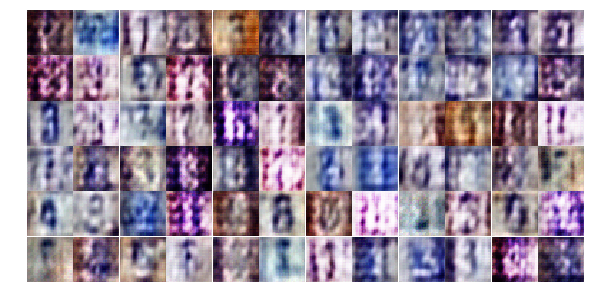

Epoch 5/10... Discriminator Loss: 0.9811... Generator Loss: 0.9612
Epoch 5/10... Discriminator Loss: 1.0452... Generator Loss: 0.6922
Epoch 5/10... Discriminator Loss: 0.9819... Generator Loss: 2.2421
Epoch 5/10... Discriminator Loss: 1.2669... Generator Loss: 0.5245
Epoch 5/10... Discriminator Loss: 1.0260... Generator Loss: 1.0020
Epoch 5/10... Discriminator Loss: 1.0501... Generator Loss: 1.1437
Epoch 5/10... Discriminator Loss: 0.9693... Generator Loss: 1.2395
Epoch 5/10... Discriminator Loss: 1.1898... Generator Loss: 0.5164
Epoch 5/10... Discriminator Loss: 1.0806... Generator Loss: 1.0891
Epoch 5/10... Discriminator Loss: 1.6919... Generator Loss: 0.3324


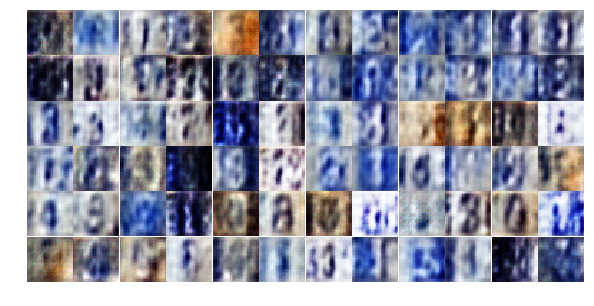

Epoch 5/10... Discriminator Loss: 1.3927... Generator Loss: 0.4091
Epoch 5/10... Discriminator Loss: 0.6570... Generator Loss: 1.7166
Epoch 5/10... Discriminator Loss: 0.6989... Generator Loss: 1.4642
Epoch 5/10... Discriminator Loss: 1.8648... Generator Loss: 0.2279
Epoch 5/10... Discriminator Loss: 0.9690... Generator Loss: 0.8147
Epoch 5/10... Discriminator Loss: 1.4727... Generator Loss: 0.8508
Epoch 5/10... Discriminator Loss: 0.9188... Generator Loss: 1.0594
Epoch 5/10... Discriminator Loss: 1.1529... Generator Loss: 0.5812
Epoch 5/10... Discriminator Loss: 0.9114... Generator Loss: 0.8897
Epoch 5/10... Discriminator Loss: 0.7715... Generator Loss: 1.8904


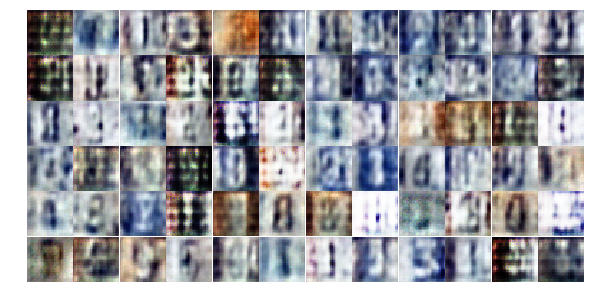

Epoch 5/10... Discriminator Loss: 1.0256... Generator Loss: 1.3006
Epoch 5/10... Discriminator Loss: 0.9303... Generator Loss: 1.1357
Epoch 5/10... Discriminator Loss: 0.9122... Generator Loss: 1.4615
Epoch 5/10... Discriminator Loss: 0.5861... Generator Loss: 1.5229
Epoch 5/10... Discriminator Loss: 1.5566... Generator Loss: 0.3960
Epoch 5/10... Discriminator Loss: 0.6056... Generator Loss: 1.3962
Epoch 5/10... Discriminator Loss: 0.8759... Generator Loss: 0.7373
Epoch 5/10... Discriminator Loss: 1.3176... Generator Loss: 0.6386
Epoch 5/10... Discriminator Loss: 1.4076... Generator Loss: 0.8307
Epoch 5/10... Discriminator Loss: 1.0616... Generator Loss: 0.9857


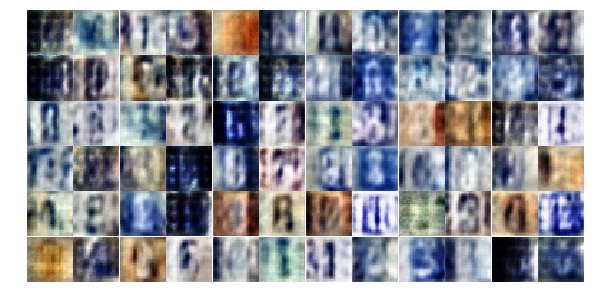

Epoch 5/10... Discriminator Loss: 1.0077... Generator Loss: 0.9117
Epoch 5/10... Discriminator Loss: 1.1435... Generator Loss: 0.6035
Epoch 5/10... Discriminator Loss: 0.7977... Generator Loss: 1.3250
Epoch 5/10... Discriminator Loss: 0.9726... Generator Loss: 1.0588
Epoch 5/10... Discriminator Loss: 1.3967... Generator Loss: 0.5453
Epoch 5/10... Discriminator Loss: 1.2231... Generator Loss: 0.7952
Epoch 5/10... Discriminator Loss: 1.1897... Generator Loss: 0.7409
Epoch 5/10... Discriminator Loss: 0.9134... Generator Loss: 0.9785
Epoch 5/10... Discriminator Loss: 1.0696... Generator Loss: 1.1153
Epoch 5/10... Discriminator Loss: 0.9674... Generator Loss: 0.8333


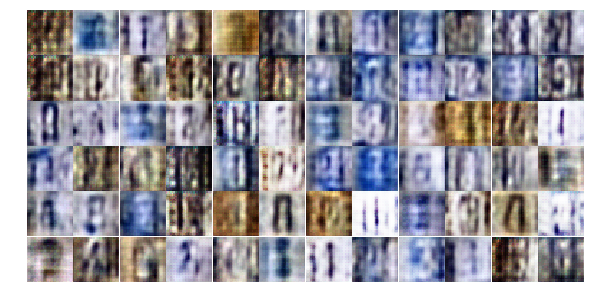

Epoch 5/10... Discriminator Loss: 0.6566... Generator Loss: 1.3320
Epoch 5/10... Discriminator Loss: 0.5868... Generator Loss: 1.8231
Epoch 5/10... Discriminator Loss: 1.3545... Generator Loss: 2.0148
Epoch 5/10... Discriminator Loss: 1.1440... Generator Loss: 1.5946
Epoch 5/10... Discriminator Loss: 1.1075... Generator Loss: 0.6472
Epoch 5/10... Discriminator Loss: 1.1928... Generator Loss: 1.0904
Epoch 5/10... Discriminator Loss: 0.8884... Generator Loss: 1.2414
Epoch 5/10... Discriminator Loss: 0.9984... Generator Loss: 1.8679
Epoch 5/10... Discriminator Loss: 1.0634... Generator Loss: 0.7433
Epoch 5/10... Discriminator Loss: 1.0725... Generator Loss: 0.9561


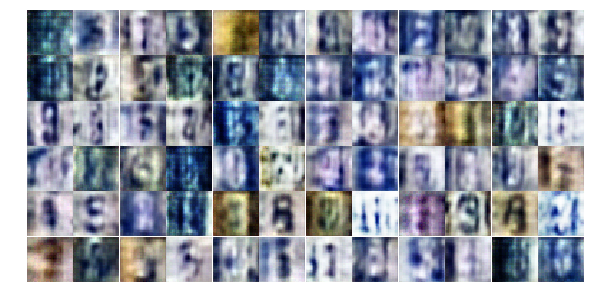

Epoch 5/10... Discriminator Loss: 0.8332... Generator Loss: 1.0001
Epoch 5/10... Discriminator Loss: 1.2447... Generator Loss: 0.6113
Epoch 5/10... Discriminator Loss: 1.1196... Generator Loss: 0.6986
Epoch 5/10... Discriminator Loss: 0.9458... Generator Loss: 0.8879
Epoch 5/10... Discriminator Loss: 0.8707... Generator Loss: 1.3602
Epoch 5/10... Discriminator Loss: 1.6288... Generator Loss: 0.3629
Epoch 6/10... Discriminator Loss: 1.4437... Generator Loss: 0.7841
Epoch 6/10... Discriminator Loss: 1.0589... Generator Loss: 0.8908
Epoch 6/10... Discriminator Loss: 0.9828... Generator Loss: 0.8560
Epoch 6/10... Discriminator Loss: 0.9415... Generator Loss: 1.0640


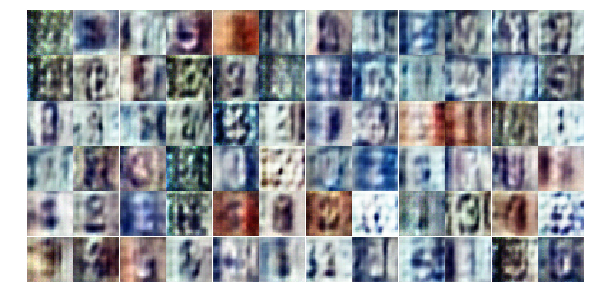

Epoch 6/10... Discriminator Loss: 1.5940... Generator Loss: 0.3247
Epoch 6/10... Discriminator Loss: 1.0284... Generator Loss: 0.6574
Epoch 6/10... Discriminator Loss: 1.0734... Generator Loss: 0.8537
Epoch 6/10... Discriminator Loss: 0.8048... Generator Loss: 1.3453
Epoch 6/10... Discriminator Loss: 0.9891... Generator Loss: 0.9936
Epoch 6/10... Discriminator Loss: 0.7932... Generator Loss: 1.1278
Epoch 6/10... Discriminator Loss: 1.1908... Generator Loss: 0.9197
Epoch 6/10... Discriminator Loss: 1.3794... Generator Loss: 0.4756
Epoch 6/10... Discriminator Loss: 1.0746... Generator Loss: 0.8707
Epoch 6/10... Discriminator Loss: 0.9069... Generator Loss: 1.3520


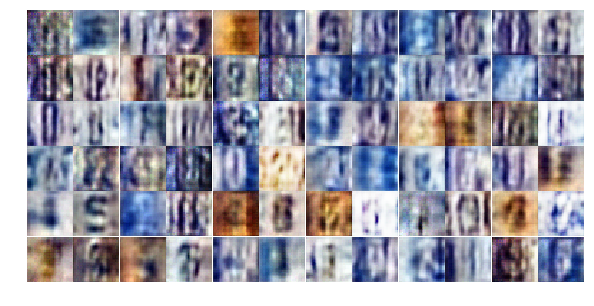

Epoch 6/10... Discriminator Loss: 0.9356... Generator Loss: 1.0987
Epoch 6/10... Discriminator Loss: 1.0054... Generator Loss: 0.9367
Epoch 6/10... Discriminator Loss: 1.3915... Generator Loss: 0.6210
Epoch 6/10... Discriminator Loss: 0.7724... Generator Loss: 1.4631
Epoch 6/10... Discriminator Loss: 0.8088... Generator Loss: 1.6028
Epoch 6/10... Discriminator Loss: 1.1647... Generator Loss: 0.9284
Epoch 6/10... Discriminator Loss: 0.9723... Generator Loss: 0.9637
Epoch 6/10... Discriminator Loss: 1.0952... Generator Loss: 0.9274
Epoch 6/10... Discriminator Loss: 1.0182... Generator Loss: 0.9936
Epoch 6/10... Discriminator Loss: 1.1250... Generator Loss: 0.7860


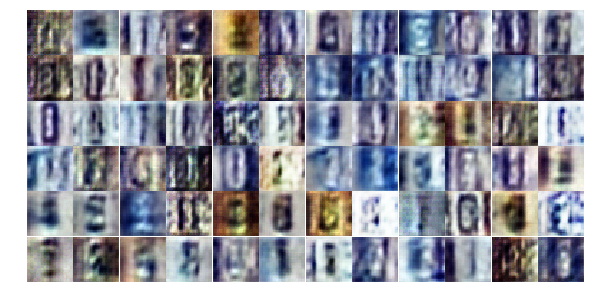

Epoch 6/10... Discriminator Loss: 0.8848... Generator Loss: 1.1290
Epoch 6/10... Discriminator Loss: 1.0723... Generator Loss: 0.8039
Epoch 6/10... Discriminator Loss: 1.2131... Generator Loss: 0.6420
Epoch 6/10... Discriminator Loss: 0.9201... Generator Loss: 1.0230
Epoch 6/10... Discriminator Loss: 1.0284... Generator Loss: 1.1335
Epoch 6/10... Discriminator Loss: 1.0274... Generator Loss: 0.8304
Epoch 6/10... Discriminator Loss: 1.0469... Generator Loss: 1.0188
Epoch 6/10... Discriminator Loss: 0.8854... Generator Loss: 1.2058
Epoch 6/10... Discriminator Loss: 1.1063... Generator Loss: 0.7277
Epoch 6/10... Discriminator Loss: 1.0545... Generator Loss: 0.8834


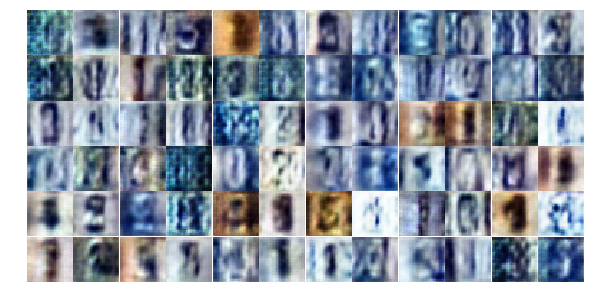

Epoch 6/10... Discriminator Loss: 1.1100... Generator Loss: 0.8383
Epoch 6/10... Discriminator Loss: 1.0282... Generator Loss: 0.9212
Epoch 6/10... Discriminator Loss: 0.9676... Generator Loss: 1.0554
Epoch 6/10... Discriminator Loss: 0.8023... Generator Loss: 1.3573
Epoch 6/10... Discriminator Loss: 0.9960... Generator Loss: 0.8110
Epoch 6/10... Discriminator Loss: 0.8872... Generator Loss: 1.1233
Epoch 6/10... Discriminator Loss: 1.1130... Generator Loss: 0.8736
Epoch 6/10... Discriminator Loss: 1.0561... Generator Loss: 0.9686
Epoch 6/10... Discriminator Loss: 1.0959... Generator Loss: 0.9505
Epoch 6/10... Discriminator Loss: 0.8317... Generator Loss: 1.0594


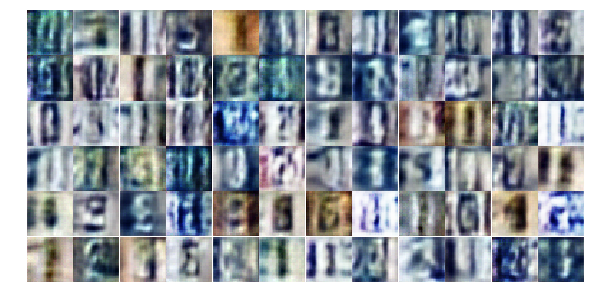

Epoch 6/10... Discriminator Loss: 1.2254... Generator Loss: 0.4990
Epoch 6/10... Discriminator Loss: 1.0263... Generator Loss: 0.7615
Epoch 6/10... Discriminator Loss: 1.0632... Generator Loss: 0.9288
Epoch 6/10... Discriminator Loss: 1.1428... Generator Loss: 0.8817
Epoch 6/10... Discriminator Loss: 0.8650... Generator Loss: 1.1901
Epoch 6/10... Discriminator Loss: 0.9801... Generator Loss: 0.9946
Epoch 6/10... Discriminator Loss: 1.0090... Generator Loss: 0.8426
Epoch 6/10... Discriminator Loss: 1.0903... Generator Loss: 0.5798
Epoch 6/10... Discriminator Loss: 0.8266... Generator Loss: 1.0249
Epoch 6/10... Discriminator Loss: 1.1535... Generator Loss: 0.6866


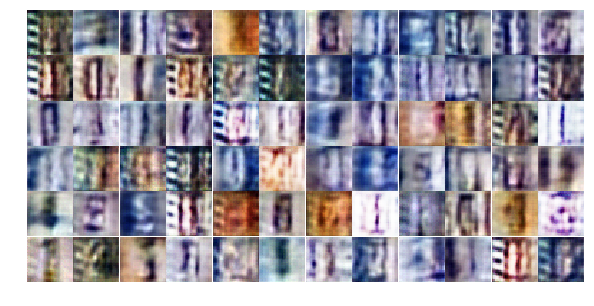

Epoch 6/10... Discriminator Loss: 1.1362... Generator Loss: 0.7776
Epoch 6/10... Discriminator Loss: 1.0684... Generator Loss: 1.3672
Epoch 6/10... Discriminator Loss: 1.0917... Generator Loss: 0.9232
Epoch 7/10... Discriminator Loss: 1.0544... Generator Loss: 0.8280
Epoch 7/10... Discriminator Loss: 1.0733... Generator Loss: 1.0232
Epoch 7/10... Discriminator Loss: 1.1248... Generator Loss: 0.8143
Epoch 7/10... Discriminator Loss: 0.9869... Generator Loss: 1.0265
Epoch 7/10... Discriminator Loss: 1.2670... Generator Loss: 0.5507
Epoch 7/10... Discriminator Loss: 1.0577... Generator Loss: 0.9948
Epoch 7/10... Discriminator Loss: 1.0148... Generator Loss: 0.9015


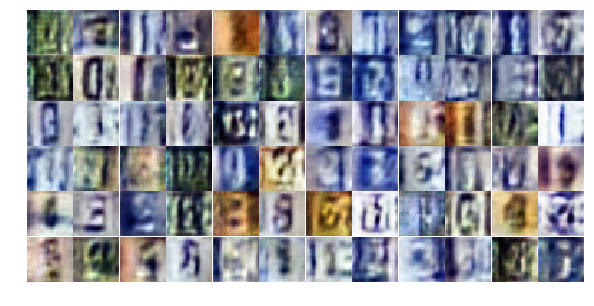

Epoch 7/10... Discriminator Loss: 1.0058... Generator Loss: 1.2543
Epoch 7/10... Discriminator Loss: 0.9979... Generator Loss: 0.9763
Epoch 7/10... Discriminator Loss: 1.0430... Generator Loss: 0.9078
Epoch 7/10... Discriminator Loss: 0.9980... Generator Loss: 0.9184
Epoch 7/10... Discriminator Loss: 0.9359... Generator Loss: 1.2020
Epoch 7/10... Discriminator Loss: 1.1160... Generator Loss: 0.6731
Epoch 7/10... Discriminator Loss: 1.1774... Generator Loss: 1.3017
Epoch 7/10... Discriminator Loss: 1.0077... Generator Loss: 0.9113
Epoch 7/10... Discriminator Loss: 1.0113... Generator Loss: 1.2364
Epoch 7/10... Discriminator Loss: 0.9310... Generator Loss: 0.8941


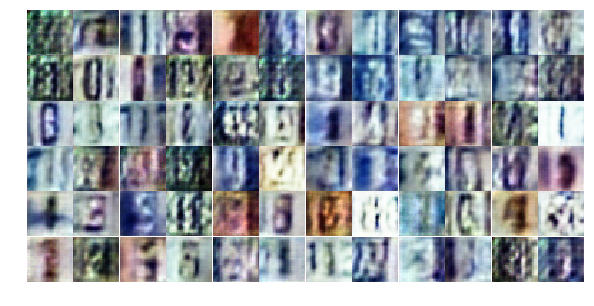

Epoch 7/10... Discriminator Loss: 1.1363... Generator Loss: 0.9947
Epoch 7/10... Discriminator Loss: 1.0051... Generator Loss: 1.0402
Epoch 7/10... Discriminator Loss: 1.0543... Generator Loss: 0.6789
Epoch 7/10... Discriminator Loss: 0.9786... Generator Loss: 1.0474
Epoch 7/10... Discriminator Loss: 0.9502... Generator Loss: 1.0825
Epoch 7/10... Discriminator Loss: 0.9541... Generator Loss: 0.9687
Epoch 7/10... Discriminator Loss: 1.0482... Generator Loss: 0.7446
Epoch 7/10... Discriminator Loss: 1.1059... Generator Loss: 0.8130
Epoch 7/10... Discriminator Loss: 0.9236... Generator Loss: 1.1166
Epoch 7/10... Discriminator Loss: 1.0079... Generator Loss: 1.0943


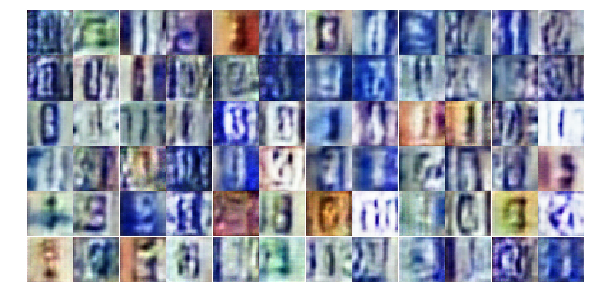

Epoch 7/10... Discriminator Loss: 1.1191... Generator Loss: 0.7386
Epoch 7/10... Discriminator Loss: 1.0823... Generator Loss: 1.1227
Epoch 7/10... Discriminator Loss: 1.0349... Generator Loss: 0.9537
Epoch 7/10... Discriminator Loss: 0.9604... Generator Loss: 0.8423
Epoch 7/10... Discriminator Loss: 1.1419... Generator Loss: 0.7014
Epoch 7/10... Discriminator Loss: 1.1626... Generator Loss: 0.7177
Epoch 7/10... Discriminator Loss: 0.9935... Generator Loss: 0.7866
Epoch 7/10... Discriminator Loss: 1.0621... Generator Loss: 0.7809
Epoch 7/10... Discriminator Loss: 1.2980... Generator Loss: 0.7568
Epoch 7/10... Discriminator Loss: 0.9755... Generator Loss: 0.9532


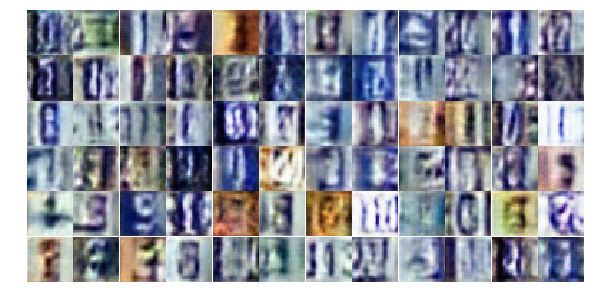

Epoch 7/10... Discriminator Loss: 1.1237... Generator Loss: 0.7373
Epoch 7/10... Discriminator Loss: 1.0600... Generator Loss: 0.9294
Epoch 7/10... Discriminator Loss: 0.9302... Generator Loss: 1.0100
Epoch 7/10... Discriminator Loss: 1.0387... Generator Loss: 1.1625
Epoch 7/10... Discriminator Loss: 1.2044... Generator Loss: 0.7170
Epoch 7/10... Discriminator Loss: 0.8827... Generator Loss: 0.8714
Epoch 7/10... Discriminator Loss: 1.0663... Generator Loss: 0.7779
Epoch 7/10... Discriminator Loss: 1.5611... Generator Loss: 0.4844
Epoch 7/10... Discriminator Loss: 0.9266... Generator Loss: 1.5292
Epoch 7/10... Discriminator Loss: 1.2139... Generator Loss: 0.6711


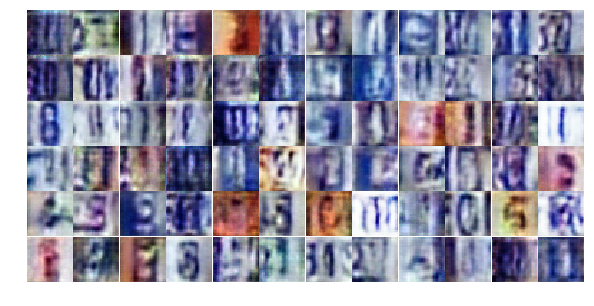

Epoch 7/10... Discriminator Loss: 1.0218... Generator Loss: 1.0559
Epoch 7/10... Discriminator Loss: 1.0387... Generator Loss: 1.0280
Epoch 7/10... Discriminator Loss: 1.3097... Generator Loss: 0.5333
Epoch 7/10... Discriminator Loss: 0.9949... Generator Loss: 0.9621
Epoch 7/10... Discriminator Loss: 1.2107... Generator Loss: 0.5860
Epoch 7/10... Discriminator Loss: 1.0624... Generator Loss: 0.9825
Epoch 7/10... Discriminator Loss: 1.2078... Generator Loss: 0.6624
Epoch 7/10... Discriminator Loss: 0.9960... Generator Loss: 0.9792
Epoch 7/10... Discriminator Loss: 1.2641... Generator Loss: 1.9660
Epoch 7/10... Discriminator Loss: 1.0552... Generator Loss: 0.6985


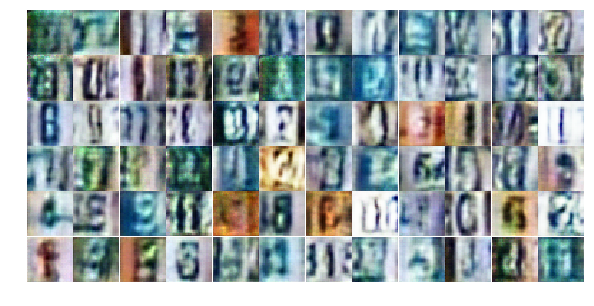

Epoch 7/10... Discriminator Loss: 0.9322... Generator Loss: 1.0400
Epoch 8/10... Discriminator Loss: 1.1423... Generator Loss: 0.7201
Epoch 8/10... Discriminator Loss: 1.1699... Generator Loss: 0.5634
Epoch 8/10... Discriminator Loss: 1.0643... Generator Loss: 0.8915
Epoch 8/10... Discriminator Loss: 1.0556... Generator Loss: 0.8376
Epoch 8/10... Discriminator Loss: 1.1081... Generator Loss: 0.8195
Epoch 8/10... Discriminator Loss: 1.1048... Generator Loss: 0.7121
Epoch 8/10... Discriminator Loss: 1.0319... Generator Loss: 1.2047
Epoch 8/10... Discriminator Loss: 1.0974... Generator Loss: 0.8655
Epoch 8/10... Discriminator Loss: 1.0757... Generator Loss: 0.7987


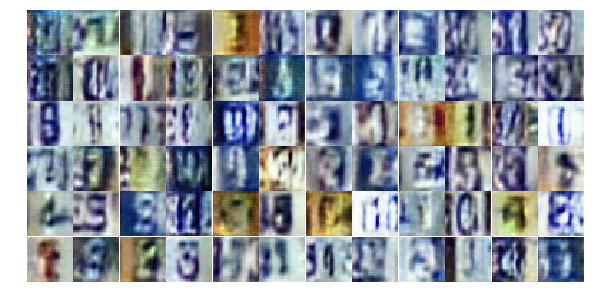

Epoch 8/10... Discriminator Loss: 0.8330... Generator Loss: 1.1702
Epoch 8/10... Discriminator Loss: 0.9390... Generator Loss: 1.3635
Epoch 8/10... Discriminator Loss: 1.1728... Generator Loss: 0.6838
Epoch 8/10... Discriminator Loss: 0.9197... Generator Loss: 0.9090
Epoch 8/10... Discriminator Loss: 1.1353... Generator Loss: 0.7870
Epoch 8/10... Discriminator Loss: 0.9838... Generator Loss: 1.0857
Epoch 8/10... Discriminator Loss: 1.2263... Generator Loss: 0.6208
Epoch 8/10... Discriminator Loss: 1.1683... Generator Loss: 1.2393
Epoch 8/10... Discriminator Loss: 1.0129... Generator Loss: 0.9347
Epoch 8/10... Discriminator Loss: 1.1169... Generator Loss: 0.6567


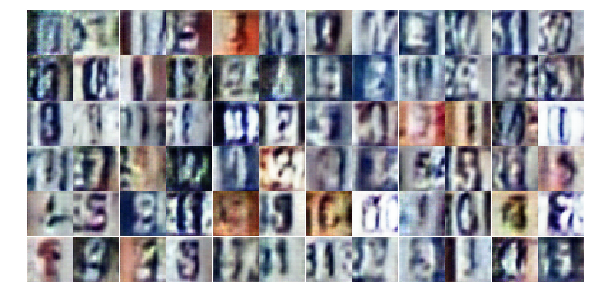

Epoch 8/10... Discriminator Loss: 1.0900... Generator Loss: 1.1133
Epoch 8/10... Discriminator Loss: 1.1213... Generator Loss: 0.7637
Epoch 8/10... Discriminator Loss: 1.0458... Generator Loss: 0.7833
Epoch 8/10... Discriminator Loss: 1.0601... Generator Loss: 1.1110
Epoch 8/10... Discriminator Loss: 0.8220... Generator Loss: 1.3711
Epoch 8/10... Discriminator Loss: 1.0727... Generator Loss: 0.8221
Epoch 8/10... Discriminator Loss: 1.1008... Generator Loss: 1.0785
Epoch 8/10... Discriminator Loss: 1.0562... Generator Loss: 0.5920
Epoch 8/10... Discriminator Loss: 1.0856... Generator Loss: 0.8061
Epoch 8/10... Discriminator Loss: 1.0313... Generator Loss: 0.7824


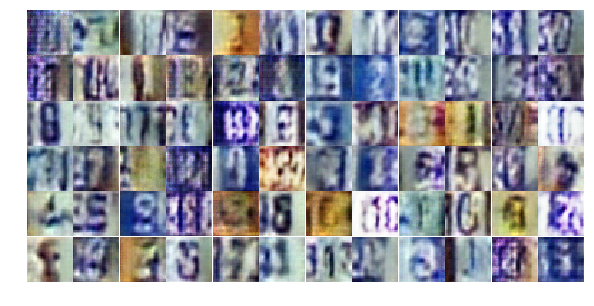

Epoch 8/10... Discriminator Loss: 1.1753... Generator Loss: 0.7883
Epoch 8/10... Discriminator Loss: 1.1473... Generator Loss: 0.7720
Epoch 8/10... Discriminator Loss: 1.0223... Generator Loss: 0.9155
Epoch 8/10... Discriminator Loss: 1.0991... Generator Loss: 0.8131
Epoch 8/10... Discriminator Loss: 1.1045... Generator Loss: 1.3188
Epoch 8/10... Discriminator Loss: 0.8242... Generator Loss: 0.9089
Epoch 8/10... Discriminator Loss: 1.0991... Generator Loss: 0.7871
Epoch 8/10... Discriminator Loss: 1.1486... Generator Loss: 0.8465
Epoch 8/10... Discriminator Loss: 1.2369... Generator Loss: 0.8218
Epoch 8/10... Discriminator Loss: 1.0293... Generator Loss: 0.8220


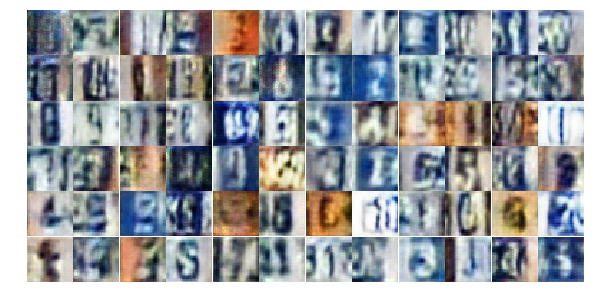

Epoch 8/10... Discriminator Loss: 0.8806... Generator Loss: 1.1333
Epoch 8/10... Discriminator Loss: 1.1710... Generator Loss: 0.6702
Epoch 8/10... Discriminator Loss: 1.2270... Generator Loss: 0.5096
Epoch 8/10... Discriminator Loss: 1.1255... Generator Loss: 0.6438
Epoch 8/10... Discriminator Loss: 1.3573... Generator Loss: 1.3765
Epoch 8/10... Discriminator Loss: 1.0672... Generator Loss: 0.9598
Epoch 8/10... Discriminator Loss: 0.9931... Generator Loss: 1.2578
Epoch 8/10... Discriminator Loss: 0.9803... Generator Loss: 1.1802
Epoch 8/10... Discriminator Loss: 1.0630... Generator Loss: 0.7121
Epoch 8/10... Discriminator Loss: 1.1680... Generator Loss: 0.7171


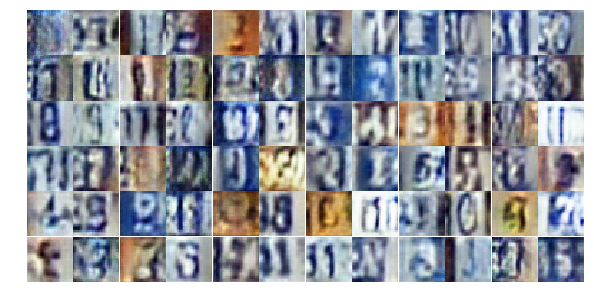

Epoch 8/10... Discriminator Loss: 0.9011... Generator Loss: 0.8887
Epoch 8/10... Discriminator Loss: 0.9397... Generator Loss: 1.1286
Epoch 8/10... Discriminator Loss: 0.9267... Generator Loss: 0.8743
Epoch 8/10... Discriminator Loss: 1.2381... Generator Loss: 0.5385
Epoch 8/10... Discriminator Loss: 0.8138... Generator Loss: 1.1987
Epoch 8/10... Discriminator Loss: 0.9805... Generator Loss: 0.9304
Epoch 8/10... Discriminator Loss: 0.8229... Generator Loss: 1.2721
Epoch 8/10... Discriminator Loss: 1.0201... Generator Loss: 1.0689
Epoch 9/10... Discriminator Loss: 1.2474... Generator Loss: 0.5674
Epoch 9/10... Discriminator Loss: 1.1483... Generator Loss: 0.7694


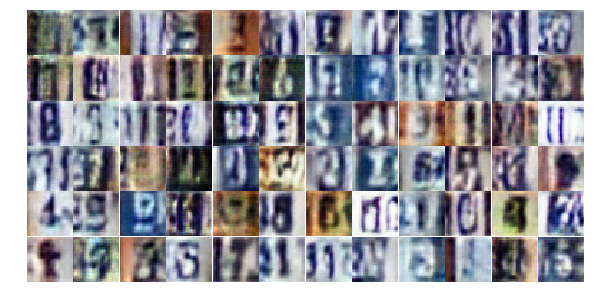

Epoch 9/10... Discriminator Loss: 0.9646... Generator Loss: 1.0562
Epoch 9/10... Discriminator Loss: 1.1943... Generator Loss: 0.6985
Epoch 9/10... Discriminator Loss: 1.2400... Generator Loss: 0.5721
Epoch 9/10... Discriminator Loss: 1.1040... Generator Loss: 0.7590
Epoch 9/10... Discriminator Loss: 1.1762... Generator Loss: 0.5955
Epoch 9/10... Discriminator Loss: 1.0390... Generator Loss: 0.7383
Epoch 9/10... Discriminator Loss: 0.9648... Generator Loss: 0.9288
Epoch 9/10... Discriminator Loss: 1.0521... Generator Loss: 0.9036
Epoch 9/10... Discriminator Loss: 1.1196... Generator Loss: 0.7027
Epoch 9/10... Discriminator Loss: 1.0646... Generator Loss: 0.7418


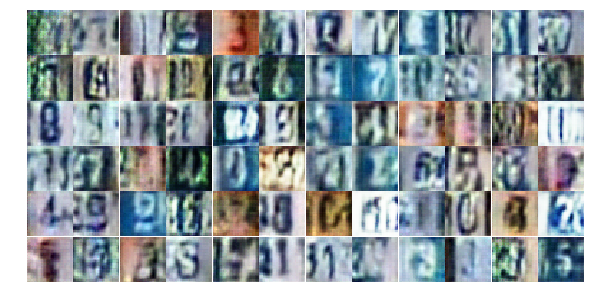

Epoch 9/10... Discriminator Loss: 1.1209... Generator Loss: 1.1420
Epoch 9/10... Discriminator Loss: 1.3500... Generator Loss: 0.5313
Epoch 9/10... Discriminator Loss: 1.1757... Generator Loss: 0.7242
Epoch 9/10... Discriminator Loss: 1.0840... Generator Loss: 0.9385
Epoch 9/10... Discriminator Loss: 1.0130... Generator Loss: 0.8437
Epoch 9/10... Discriminator Loss: 1.2570... Generator Loss: 0.4809
Epoch 9/10... Discriminator Loss: 1.1794... Generator Loss: 0.5971
Epoch 9/10... Discriminator Loss: 0.9971... Generator Loss: 0.8730
Epoch 9/10... Discriminator Loss: 1.2628... Generator Loss: 0.5196
Epoch 9/10... Discriminator Loss: 1.0288... Generator Loss: 0.9406


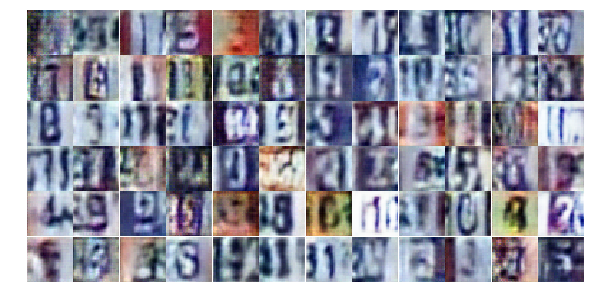

Epoch 9/10... Discriminator Loss: 1.1971... Generator Loss: 0.5961
Epoch 9/10... Discriminator Loss: 0.9833... Generator Loss: 1.0447
Epoch 9/10... Discriminator Loss: 1.0476... Generator Loss: 0.8631
Epoch 9/10... Discriminator Loss: 1.0853... Generator Loss: 0.7625
Epoch 9/10... Discriminator Loss: 0.9371... Generator Loss: 0.9378
Epoch 9/10... Discriminator Loss: 1.2198... Generator Loss: 0.8664
Epoch 9/10... Discriminator Loss: 1.1525... Generator Loss: 0.5361
Epoch 9/10... Discriminator Loss: 0.8907... Generator Loss: 1.0839
Epoch 9/10... Discriminator Loss: 1.0472... Generator Loss: 0.8621
Epoch 9/10... Discriminator Loss: 1.1474... Generator Loss: 0.6272


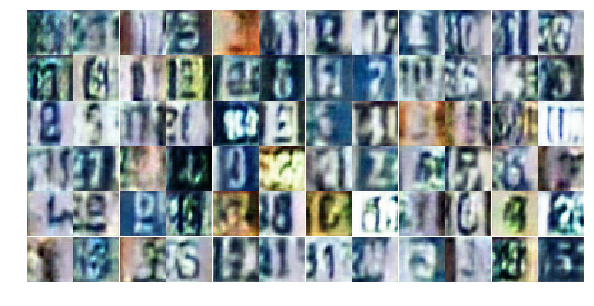

Epoch 9/10... Discriminator Loss: 0.9938... Generator Loss: 0.8158
Epoch 9/10... Discriminator Loss: 0.9170... Generator Loss: 0.8862
Epoch 9/10... Discriminator Loss: 1.1313... Generator Loss: 0.8225
Epoch 9/10... Discriminator Loss: 1.1780... Generator Loss: 0.5975
Epoch 9/10... Discriminator Loss: 0.9947... Generator Loss: 1.0963
Epoch 9/10... Discriminator Loss: 1.0098... Generator Loss: 0.7518
Epoch 9/10... Discriminator Loss: 0.8860... Generator Loss: 1.0344
Epoch 9/10... Discriminator Loss: 0.8818... Generator Loss: 0.7843
Epoch 9/10... Discriminator Loss: 1.1359... Generator Loss: 0.6327
Epoch 9/10... Discriminator Loss: 1.3339... Generator Loss: 0.4863


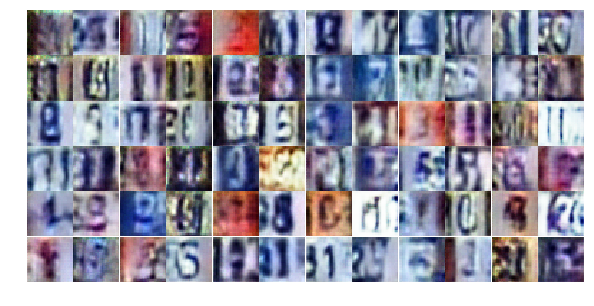

Epoch 9/10... Discriminator Loss: 0.9977... Generator Loss: 1.0803
Epoch 9/10... Discriminator Loss: 1.0923... Generator Loss: 0.9910
Epoch 9/10... Discriminator Loss: 0.9777... Generator Loss: 0.9224
Epoch 9/10... Discriminator Loss: 1.1765... Generator Loss: 0.6638
Epoch 9/10... Discriminator Loss: 1.0210... Generator Loss: 1.0131
Epoch 9/10... Discriminator Loss: 1.1307... Generator Loss: 0.6726
Epoch 9/10... Discriminator Loss: 1.0915... Generator Loss: 0.7706
Epoch 9/10... Discriminator Loss: 1.1260... Generator Loss: 0.6858
Epoch 9/10... Discriminator Loss: 0.8779... Generator Loss: 0.9292
Epoch 9/10... Discriminator Loss: 1.0900... Generator Loss: 1.2559


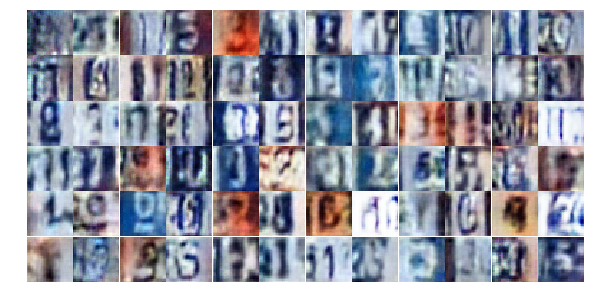

Epoch 9/10... Discriminator Loss: 1.0851... Generator Loss: 0.7783
Epoch 9/10... Discriminator Loss: 1.6816... Generator Loss: 1.2209
Epoch 9/10... Discriminator Loss: 0.9210... Generator Loss: 0.9000
Epoch 9/10... Discriminator Loss: 1.2983... Generator Loss: 0.5161
Epoch 9/10... Discriminator Loss: 1.1660... Generator Loss: 0.5681
Epoch 10/10... Discriminator Loss: 1.0896... Generator Loss: 0.7346
Epoch 10/10... Discriminator Loss: 0.9332... Generator Loss: 1.2088
Epoch 10/10... Discriminator Loss: 1.4412... Generator Loss: 0.4315
Epoch 10/10... Discriminator Loss: 1.2033... Generator Loss: 0.5215
Epoch 10/10... Discriminator Loss: 1.1444... Generator Loss: 0.6282


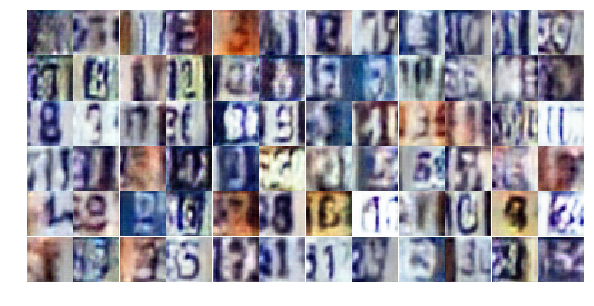

Epoch 10/10... Discriminator Loss: 1.0156... Generator Loss: 0.8170
Epoch 10/10... Discriminator Loss: 0.9737... Generator Loss: 0.8297
Epoch 10/10... Discriminator Loss: 0.9905... Generator Loss: 0.9227
Epoch 10/10... Discriminator Loss: 1.0264... Generator Loss: 1.0628
Epoch 10/10... Discriminator Loss: 0.9347... Generator Loss: 0.9560
Epoch 10/10... Discriminator Loss: 0.9599... Generator Loss: 0.9672
Epoch 10/10... Discriminator Loss: 0.9974... Generator Loss: 0.9332
Epoch 10/10... Discriminator Loss: 1.0952... Generator Loss: 0.6721
Epoch 10/10... Discriminator Loss: 1.2390... Generator Loss: 0.6603
Epoch 10/10... Discriminator Loss: 0.8386... Generator Loss: 1.1717


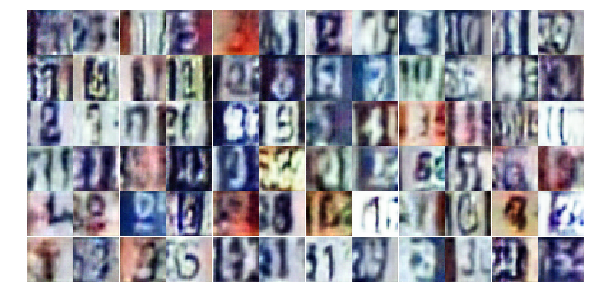

Epoch 10/10... Discriminator Loss: 1.1561... Generator Loss: 0.5770
Epoch 10/10... Discriminator Loss: 1.2803... Generator Loss: 0.4194
Epoch 10/10... Discriminator Loss: 1.0803... Generator Loss: 0.7598
Epoch 10/10... Discriminator Loss: 1.3546... Generator Loss: 0.4921
Epoch 10/10... Discriminator Loss: 1.1029... Generator Loss: 0.9603
Epoch 10/10... Discriminator Loss: 1.0924... Generator Loss: 0.8216
Epoch 10/10... Discriminator Loss: 1.1136... Generator Loss: 0.7126
Epoch 10/10... Discriminator Loss: 1.1121... Generator Loss: 0.6513
Epoch 10/10... Discriminator Loss: 1.0818... Generator Loss: 0.9452
Epoch 10/10... Discriminator Loss: 0.8894... Generator Loss: 1.1456


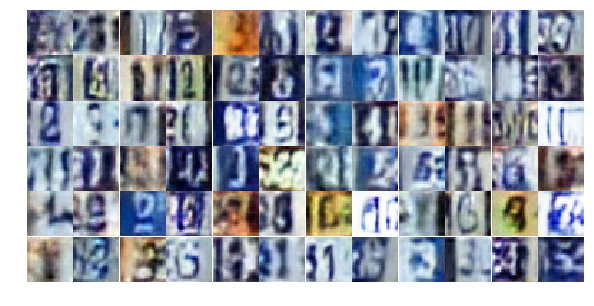

Epoch 10/10... Discriminator Loss: 1.0749... Generator Loss: 0.6905
Epoch 10/10... Discriminator Loss: 1.1877... Generator Loss: 0.6605
Epoch 10/10... Discriminator Loss: 0.8480... Generator Loss: 0.9997
Epoch 10/10... Discriminator Loss: 1.1220... Generator Loss: 1.7441
Epoch 10/10... Discriminator Loss: 1.3376... Generator Loss: 0.4746
Epoch 10/10... Discriminator Loss: 1.0801... Generator Loss: 0.9047
Epoch 10/10... Discriminator Loss: 0.8356... Generator Loss: 1.1510
Epoch 10/10... Discriminator Loss: 0.9705... Generator Loss: 1.0608
Epoch 10/10... Discriminator Loss: 1.0241... Generator Loss: 0.6245
Epoch 10/10... Discriminator Loss: 1.0556... Generator Loss: 1.0089


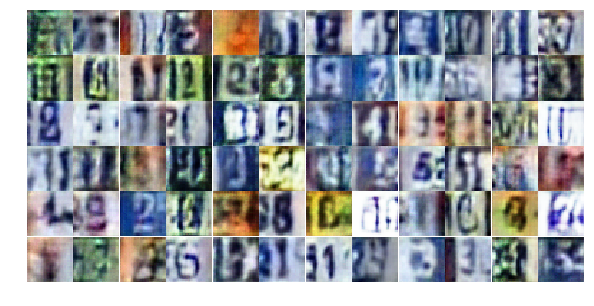

Epoch 10/10... Discriminator Loss: 0.9816... Generator Loss: 0.9979
Epoch 10/10... Discriminator Loss: 1.4018... Generator Loss: 0.4054
Epoch 10/10... Discriminator Loss: 0.9975... Generator Loss: 0.8912
Epoch 10/10... Discriminator Loss: 0.9639... Generator Loss: 1.0230
Epoch 10/10... Discriminator Loss: 1.1442... Generator Loss: 0.7223
Epoch 10/10... Discriminator Loss: 1.1231... Generator Loss: 0.9774
Epoch 10/10... Discriminator Loss: 1.1128... Generator Loss: 1.1190
Epoch 10/10... Discriminator Loss: 1.3031... Generator Loss: 0.4908
Epoch 10/10... Discriminator Loss: 1.0068... Generator Loss: 0.6814
Epoch 10/10... Discriminator Loss: 0.9410... Generator Loss: 0.9865


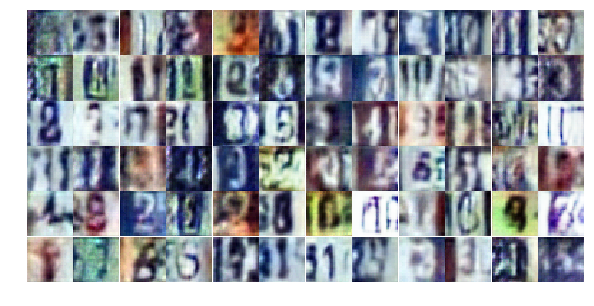

Epoch 10/10... Discriminator Loss: 1.1257... Generator Loss: 0.5580
Epoch 10/10... Discriminator Loss: 1.1027... Generator Loss: 0.7415
Epoch 10/10... Discriminator Loss: 1.3193... Generator Loss: 0.4680
Epoch 10/10... Discriminator Loss: 1.0432... Generator Loss: 0.8232
Epoch 10/10... Discriminator Loss: 0.8864... Generator Loss: 1.0885
Epoch 10/10... Discriminator Loss: 1.0998... Generator Loss: 1.1638
Epoch 10/10... Discriminator Loss: 1.0277... Generator Loss: 0.8079
Epoch 10/10... Discriminator Loss: 0.8682... Generator Loss: 1.0793
Epoch 10/10... Discriminator Loss: 1.0654... Generator Loss: 0.8516
Epoch 10/10... Discriminator Loss: 0.8280... Generator Loss: 1.0704


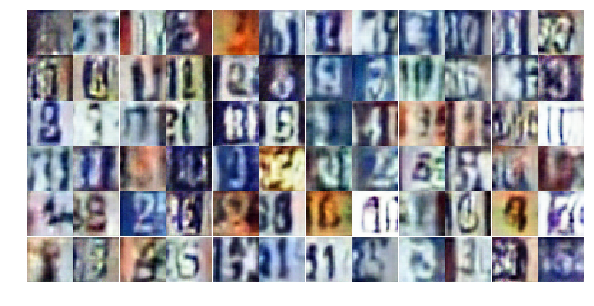

Epoch 10/10... Discriminator Loss: 1.3602... Generator Loss: 0.4232
Epoch 10/10... Discriminator Loss: 0.9589... Generator Loss: 0.9418
Epoch 10/10... Discriminator Loss: 0.9033... Generator Loss: 0.7599


In [18]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))